# PANDAS!

Let's go through a brief introduction to pandas that will allow us to make a cool image using our data.

## Library imports:

In [1]:
import pandas as pd # tables library like sql
import numpy as np # linear algebra
import matplotlib.pyplot as plt # visualization
import os
import cv2 # image library

## Reading csv files with pandas

In [2]:
posters = pd.read_csv("../data/posters-and-genres.csv")
movie_metadata = pd.read_csv("../data/movies-metadata.csv", thousands=",") # thousands is a keyword argument to read strings with "," in what should be numerical values (converts string to float)

In [3]:
posters.head()

,Id,Genre,Action,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,...,N/A,News,Reality-TV,Romance,Sci-Fi,Short,Sport,Thriller,War,Western
0,tt0086425,"['Comedy', 'Drama']",0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,tt0085549,"['Drama', 'Romance', 'Music']",0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0
2,tt0086465,['Comedy'],0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,tt0086567,"['Sci-Fi', 'Thriller']",0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,tt0086034,"['Action', 'Adventure', 'Thriller']",1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


As you can see, `imdbVotes` has dtype float:

In [4]:
movie_metadata.head()

,Unnamed: 0,_id,Language,Box_office,Country,Rated,imdbID,Awards,Poster,Director,...,Writer,imdbVotes,Runtime,Response,imdbRating,Title,Genre,Actors,Type,Metascore
0,0,56fb860e71a0651b0c306f55,English,290158751.0,USA,PG,tt0080684,Won 1 Oscar. Another 15 wins & 18 nominations.,http://ia.media-imdb.com/images/M/MV5BMjE2MzQw...,Irvin Kershner,...,"Leigh Brackett (screenplay), Lawrence Kasdan (...",799579.0,124 min,True,8.8,Star Wars: Episode V - The Empire Strikes Back,"Action, Adventure, Fantasy","Mark Hamill, Harrison Ford, Carrie Fisher, Bil...",movie,79.0
1,1,56fb860e71a0651b0c306f56,English,101500000.0,USA,R,tt0081562,1 nomination.,http://ia.media-imdb.com/images/M/MV5BMTM4OTI3...,Sidney Poitier,...,Bruce Jay Friedman,17705.0,111 min,True,6.8,Stir Crazy,"Comedy, Crime","Gene Wilder, Richard Pryor, Georg Stanford Bro...",movie,50.0
2,2,56fb860e71a0651b0c306f57,English,83400000.0,USA,PG,tt0080339,Nominated for 1 Golden Globe. Another 2 wins &...,http://ia.media-imdb.com/images/M/MV5BNDU2MjE4...,"Jim Abrahams, David Zucker, Jerry Zucker",...,"Jim Abrahams (written for the screen by), Davi...",154994.0,88 min,True,7.8,Airplane!,Comedy,"Kareem Abdul-Jabbar, Lloyd Bridges, Peter Grav...",movie,NaN
3,3,56fb860e71a0651b0c306f58,English,NaN,USA,PG,tt0080377,1 win.,http://ia.media-imdb.com/images/M/MV5BMTc5MTc5...,Buddy Van Horn,...,"Jeremy Joe Kronsberg (characters), Stanford Sh...",12639.0,116 min,True,6.0,Any Which Way You Can,"Action, Comedy","Clint Eastwood, Sondra Locke, Geoffrey Lewis, ...",movie,NaN
4,4,56fb860e71a0651b0c306f59,English,69800000.0,USA,R,tt0081375,Nominated for 3 Oscars. Another 1 win & 3 nomi...,http://ia.media-imdb.com/images/M/MV5BMjIyNjkx...,Howard Zieff,...,"Nancy Meyers, Charles Shyer, Harvey Miller",17591.0,109 min,True,6.1,Private Benjamin,"Comedy, War","Goldie Hawn, Eileen Brennan, Armand Assante, R...",movie,NaN


## Rename columns or access only specific columns

here, we will want to combine these dataframes, so we can rename the `Id` key in the posters dataframe to `imdbID` to match that id from `movie_metadata`.

In [5]:
posters = posters.rename(columns={'Id': 'imdbID'})

Now, keeping all of those columns in the `movie_metadata` is not useful for us, so let's only keep what we need

In [6]:
# DataFrames can be accessed with numerical columns or named columns. Let's look at all the columns
movie_metadata.columns

Index(['Unnamed: 0', '_id', 'Language', 'Box_office', 'Country', 'Rated',
       'imdbID', 'Awards', 'Poster', 'Director', 'Released', 'Writer',
       'imdbVotes', 'Runtime', 'Response', 'imdbRating', 'Title', 'Genre',
       'Actors', 'Type', 'Metascore'],
      dtype='object')

In [7]:
# let's just keep only a few columns we want to use or want to identify a particular data entry
movie_metadata = movie_metadata[['imdbID', 'imdbVotes', 'imdbRating', 'Title', 'Released']]
movie_metadata.head()

,imdbID,imdbVotes,imdbRating,Title,Released
0,tt0080684,799579.0,8.8,Star Wars: Episode V - The Empire Strikes Back,20 Jun 1980
1,tt0081562,17705.0,6.8,Stir Crazy,12 Dec 1980
2,tt0080339,154994.0,7.8,Airplane!,02 Jul 1980
3,tt0080377,12639.0,6.0,Any Which Way You Can,17 Dec 1980
4,tt0081375,17591.0,6.1,Private Benjamin,10 Oct 1980


## Merging or joining DataFrames

Like in SQL, tables can be joined. Fortunately, pandas has a little more versatile way of joining tables. the `join` method will join two tables by their index, but the `merge` method, which we will use, allows you to specify which column you want to merge. We don't have cleanly indexed dataframe, so we understand the imdbID column to be the "primary key" or unique identifier for the data sample. By default, merge uses the inner join (but it can be changed to outer join or others)

In [8]:
print(movie_metadata.shape)
print(posters.shape)

(8873, 5)
(7254, 27)


So `posters` is missing a few samples that are present in `movie_metadata`. This may be because not all movie posters were available as downloadable images when this dataset was created. Indeed, if you were to try to locate some of the poster paths as specified in the `movies-metadata.csv`, some have been taken down online. As a result, we will make sure we only join on values that are present, since the images are the core of this task.

In [9]:
movie_metadata = movie_metadata.merge(posters, on="imdbID")
movie_metadata.shape

(7278, 31)

The number of columns increased to the length of the union of columns from `posters` and `movies_metadata` (len(`posters`) + len(`movie_metadata`) - intersection(`posters`, `movie_metadata`)). The only instersecting column was `imdbID`.

As you can see, the length (number of rows) of the dataframe was reduced, but it is still larger than the number of samples in `posters`. Let's investigate that by checking for missing values.

In [10]:
# are any values null?
movie_metadata.isnull().values.any()

True

In [11]:
# how many values are missing in each column?
movie_metadata.isnull().sum()

imdbID          0
imdbVotes      23
imdbRating     22
Title           0
Released       50
Genre           0
Action          0
Adventure       0
Animation       0
Biography       0
Comedy          0
Crime           0
Documentary     0
Drama           0
Family          0
Fantasy         0
History         0
Horror          0
Music           0
Musical         0
Mystery         0
N/A             0
News            0
Reality-TV      0
Romance         0
Sci-Fi          0
Short           0
Sport           0
Thriller        0
War             0
Western         0
dtype: int64

In [12]:
# are there duplicates?
duplicates = movie_metadata['imdbID'].duplicated(keep=False)
duplicates.any()

True

In [13]:
# how many?
duplicates.sum()

48

In [14]:
# this will remove duplicates that have the same values across all columns
movie_metadata = movie_metadata.drop_duplicates()
movie_metadata.shape

(7242, 31)

In [15]:
# are there any more duplicates?
duplicates = movie_metadata['imdbID'].duplicated(keep=False)
duplicates.any()

False

## Apply some methods to change the DataFrame

Iterating through a DataFrame object is not recommended, so if we wanted to manipulate a DataFrame with a function applied to each row/sample in a DataFrame, we use the `apply` method.

First, we need to define a function. Let's create a function to extract the release year.

In [16]:
def create_year(series_object):
    '''
    this method will take the vlue from the 'Released' column from a specific row (as a Pandas Series Object), and return the year as an int
    '''
    if isinstance(series_object['Released'], str):
        year = int(series_object['Released'].split()[-1])
    else:
        year = 0
    return year

Now we can use this function to create a new column in the DataFrame. Make sure to call this method on the right axis.

In [17]:
movie_metadata['year'] = movie_metadata.apply(create_year, axis=1)

we now have a `year` column.

In [18]:
movie_metadata.head()

,imdbID,imdbVotes,imdbRating,Title,Released,Genre,Action,Adventure,Animation,Biography,...,News,Reality-TV,Romance,Sci-Fi,Short,Sport,Thriller,War,Western,year
0,tt0086425,39168.0,7.4,Terms of Endearment,09 Dec 1983,"['Comedy', 'Drama']",0,0,0,0,...,0,0,0,0,0,0,0,0,0,1983
1,tt0085549,33842.0,6.1,Flashdance,15 Apr 1983,"['Drama', 'Romance', 'Music']",0,0,0,0,...,0,0,1,0,0,0,0,0,0,1983
2,tt0086465,99892.0,7.5,Trading Places,08 Jun 1983,['Comedy'],0,0,0,0,...,0,0,0,0,0,0,0,0,0,1983
3,tt0086567,69986.0,7.1,WarGames,03 Jun 1983,"['Sci-Fi', 'Thriller']",0,0,0,0,...,0,0,0,1,0,0,1,0,0,1983
4,tt0086034,72142.0,6.6,Octopussy,10 Jun 1983,"['Action', 'Adventure', 'Thriller']",1,1,0,0,...,0,0,0,0,0,0,1,0,0,1983


Now in this image we are about to create, we only want to keep some movies that have been seen and enjoyed by the general public. To determine what these movies are, we will create a weighted average metric as defined by IMDb:
```
w = rating * num_votes / (num_votes + m) + avg_rating * m / (num_votes + m)

where m = minimum votes required to be listed in chart, which in our case will be the 90th percentile
```

First, we need to calculate `m`. This will represent the minimum number of votes that makes up at least 90% of the movies in the list. Esentially, this cuts off the movies that don't have a lot of votes.

In [19]:
m = movie_metadata['imdbVotes'].quantile(0.9)
m

134240.59999999998

In [20]:
movies_with_votes = movie_metadata.copy().loc[movie_metadata['imdbVotes'] >= m]
movies_with_votes.shape

(722, 32)

Now let's calulcate `c`. Which will be the average `imdbRating`

In [21]:
c = movie_metadata['imdbRating'].mean()
c

6.277590027700831

Now let's write a function that will return this imdb weighted average:

In [22]:
def weighted_rating(series_object, min_votes, avg_rating):    
    num_votes = series_object['imdbVotes']
    rating = series_object['imdbRating']
    # Calculation based on the IMDB formula
    return (num_votes / (num_votes + min_votes) * rating) + (min_votes / (min_votes + num_votes) * avg_rating)

Call the function. Because this method needs to take parameters, we will need to call it as a lambda function

In [23]:
movies_with_votes['score'] = movies_with_votes.apply(lambda x: weighted_rating(x, m, c), axis=1)

Now let's sort these movies and show them

In [24]:
movies_with_votes.sort_values(['score'], ascending=False, inplace=True) # the inplace keyword is the same thing as setting this method equal to movies_with_votes
movies_with_votes[['Title', 'score', 'year']].head()

,Title,score,year
1890,The Shawshank Redemption,9.069621,1994
4992,The Dark Knight,8.789503,2008
2915,Fight Club,8.652377,1999
1854,Pulp Fiction,8.649101,1994
3798,The Lord of the Rings: The Return of the King,8.630813,2003


Just to show that pandas is great, you can do multiple sort, where the order of the column takes precedence.

In [25]:
# this will sort by year in descending order, then on ties it will sort by score in descending order
movies_with_votes[['Title', 'score', 'year']].sort_values(['year', 'score'], ascending=[False, False]).head()

,Title,score,year
6925,American Sniper,6.989181,2015
6938,Interstellar,8.287805,2014
7029,Whiplash,7.895106,2014
6927,Guardians of the Galaxy,7.782315,2014
6940,Gone Girl,7.732684,2014


## Grouping

In [26]:
movies_grouped_by_release_year = movies_with_votes.groupby(['year'], sort=True)
movies_grouped_by_release_year.head()

,imdbID,imdbVotes,imdbRating,Title,Released,Genre,Action,Adventure,Animation,Biography,...,Reality-TV,Romance,Sci-Fi,Short,Sport,Thriller,War,Western,year,score
1890,tt0111161,1626900.0,9.3,The Shawshank Redemption,14 Oct 1994,"['Crime', 'Drama']",0,0,0,0,...,0,0,0,0,0,0,0,0,1994,9.069621
4992,tt0468569,1601928.0,9.0,The Dark Knight,18 Jul 2008,"['Action', 'Crime', 'Drama']",1,0,0,0,...,0,0,0,0,0,0,0,0,2008,8.789503
2915,tt0137523,1287410.0,8.9,Fight Club,15 Oct 1999,['Drama'],0,0,0,0,...,0,0,0,0,0,0,0,0,1999,8.652377
1854,tt0110912,1268850.0,8.9,Pulp Fiction,14 Oct 1994,"['Crime', 'Drama']",0,0,0,0,...,0,0,0,0,0,0,0,0,1994,8.649101
3798,tt0167260,1173526.0,8.9,The Lord of the Rings: The Return of the King,17 Dec 2003,"['Adventure', 'Drama', 'Fantasy']",0,1,0,0,...,0,0,0,0,0,0,0,0,2003,8.630813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,tt0103874,139639.0,7.5,Bram Stoker's Dracula,13 Nov 1992,"['Fantasy', 'Horror', 'Romance']",0,0,0,0,...,0,1,0,0,0,0,0,0,1992,6.900842
760,tt0094737,148326.0,7.3,Big,03 Jun 1988,"['Comedy', 'Drama', 'Fantasy']",0,0,0,0,...,0,0,0,0,0,0,0,0,1988,6.814278
398,tt0092099,213242.0,6.9,Top Gun,16 May 1986,"['Action', 'Drama', 'Romance']",1,0,0,0,...,0,1,0,0,0,0,0,0,1986,6.659549
1309,tt0102798,141835.0,6.9,Robin Hood: Prince of Thieves,14 Jun 1991,"['Action', 'Adventure', 'Drama']",1,1,0,0,...,0,0,0,0,0,0,0,0,1991,6.597356


Now this table doesn't looked grouped, but the next methods will show that it is.

In [27]:
max_in_group = movies_grouped_by_release_year['score'].transform(max)
max_in_group.head()

1890    9.069621
4992    8.789503
2915    8.652377
1854    9.069621
3798    8.630813
Name: score, dtype: float64

In [28]:
# return booleans that define what indices are equal in the DataFrameGroupBy object, getting the index of the value that is equal to the max within each group
idx = max_in_group == movies_with_votes['score']
idx

1890     True
4992     True
2915     True
1854    False
3798     True
        ...  
6594    False
4998    False
5875    False
5602    False
5316    False
Name: score, Length: 722, dtype: bool

Now we can get the max for each year finally.

In [29]:
highest_rated_per_year = movies_with_votes[idx].sort_values(['year'])
highest_rated_per_year.head()

,imdbID,imdbVotes,imdbRating,Title,Released,Genre,Action,Adventure,Animation,Biography,...,Reality-TV,Romance,Sci-Fi,Short,Sport,Thriller,War,Western,year,score
133,tt0088247,575339.0,8.1,The Terminator,26 Oct 1984,"['Action', 'Sci-Fi']",1,0,0,0,...,0,0,1,0,0,0,0,0,1984,7.755230
248,tt0088763,699256.0,8.5,Back to the Future,03 Jul 1985,"['Adventure', 'Comedy', 'Sci-Fi']",0,1,0,0,...,0,0,1,0,0,0,0,0,1985,8.142065
404,tt0090605,469658.0,8.4,Aliens,18 Jul 1986,"['Action', 'Horror', 'Sci-Fi']",1,0,0,0,...,0,0,1,0,0,0,0,0,1986,7.928210
588,tt0093058,463756.0,8.3,Full Metal Jacket,10 Jul 1987,"['Drama', 'War']",0,0,0,0,...,0,0,0,0,0,0,1,0,1987,7.846002
763,tt0095016,571201.0,8.2,Die Hard,20 Jul 1988,"['Action', 'Thriller']",1,0,0,0,...,0,0,0,0,0,1,0,0,1988,7.834179


## A function to get all the posters from the highest rated (by weighted average) for (almost) every year

first let's look at one example of the images

In [30]:
ids = highest_rated_per_year['imdbID'].values
ids

array(['tt0088247', 'tt0088763', 'tt0090605', 'tt0093058', 'tt0095016',
       'tt0097576', 'tt0099685', 'tt0102926', 'tt0105236', 'tt0107290',
       'tt0111161', 'tt0114814', 'tt0117951', 'tt0119488', 'tt0120815',
       'tt0137523', 'tt0172495', 'tt0120737', 'tt0167261', 'tt0167260',
       'tt0338013', 'tt0405159', 'tt0407887', 'tt0477348', 'tt0468569',
       'tt0361748', 'tt1375666', 'tt1201607', 'tt1345836', 'tt0993846',
       'tt0816692', 'tt2179136'], dtype=object)

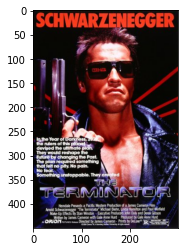

In [31]:
id_1980 = ids[0]
img_dir = "../data/Images/"
img = cv2.imread(os.path.join(img_dir, id_1980 + ".jpg"))
# unfortunately, open-cv read images in bgr instead of rgb, so we have to convert it
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

Let's write a function to get all the images together

In [32]:
def make_image_stack(img_ids):
    img_dir = "../data/Images/"

    img_stack = []
    num_rows = 4 # let's have 4 rows of posters
    num_cols = len(img_ids) // 4 # let's have 8 columns

    for i in range(num_rows):
        row = []
        for id in img_ids[num_cols*i:num_cols*(1+i)]:
            img = cv2.imread(os.path.join(img_dir, id + ".jpg"))
            # we have to resize the images so we can concatenate them
            img = cv2.resize(img, (300, 450), interpolation=cv2.INTER_AREA)
            row.append(img)
        if len(row) == num_cols: # condition to eliminate the remainder of len(img_ids) / 4
            img_stack.append(np.concatenate(row, axis=1))

    img_stack = np.concatenate(img_stack, axis=0)
    img_stack = cv2.cvtColor(img_stack, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(40, 80))
    plt.imshow(img_stack)
    plt.xticks([])
    plt.yticks([])
    plt.show()

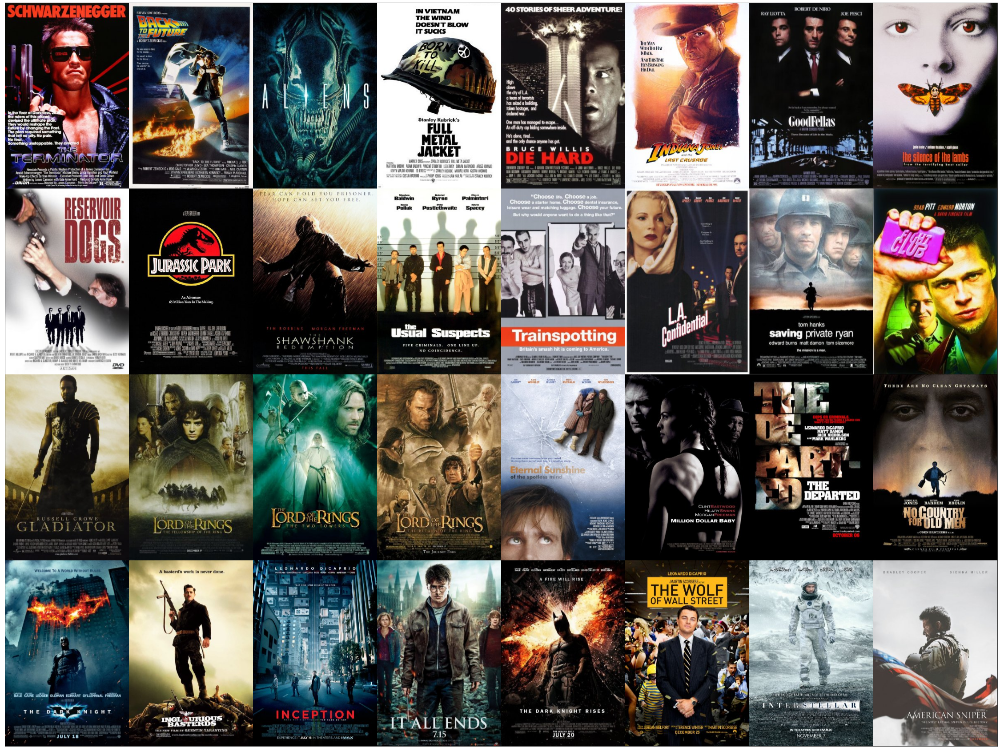

In [33]:
make_image_stack(ids)

## And that is the end!